In [ ]:
!pip install catboost lightgbm

In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import time

from sklearn.dummy import DummyClassifier

from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, StratifiedKFold, cross_val_score
from imblearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.metrics import (accuracy_score, f1_score, precision_score,
                             recall_score, roc_auc_score,
                             classification_report,confusion_matrix, ConfusionMatrixDisplay,
                             precision_recall_curve, PrecisionRecallDisplay,
                             roc_curve, auc,RocCurveDisplay)
from sklearn.inspection import permutation_importance
from sklearn.base import clone

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from catboost import CatBoostClassifier
from lightgbm import LGBMClassifier


from imblearn.over_sampling import RandomOverSampler, SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTETomek
from imblearn.pipeline import Pipeline as imbPipeline

import shap

plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette('husl')

In [ ]:
data = pd.read_csv('/kaggle/input/datasets/blastchar/telco-customer-churn/WA_Fn-UseC_-Telco-Customer-Churn.csv')
print(f'Amount of TotalCharges == " ": {data["TotalCharges"].str.isspace().sum()}')
data['TotalCharges'] = pd.to_numeric(data['TotalCharges'], errors='coerce')
print(f'Amount of NaN after conversion: {data["TotalCharges"].isna().sum()}')

data['TotalCharges'] = data['TotalCharges'].fillna(0).astype("float64")

data['SeniorCitizen'] = data['SeniorCitizen'].astype(int)

del data['customerID']

data.head(5)

Amount of TotalCharges == " ": 11
Amount of NaN after conversion: 11


,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,Female,0,Yes,No,1,No,No phone service,DSL,No,Yes,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,Male,0,No,No,34,Yes,No,DSL,Yes,No,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,Male,0,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,Male,0,No,No,45,No,No phone service,DSL,Yes,No,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,Female,0,No,No,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


## Feature Engineering

In [ ]:
extra_services = ['MultipleLines', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies']
data['has_extra_services'] = data[extra_services].apply(lambda x: (x=='Yes').any(), axis=1).astype(int)
data['number_of_extra_services'] = data[extra_services].apply(lambda x: (x=='Yes').sum(), axis=1)
data['charge_to_tenure_ratio'] = data['MonthlyCharges'] / (data['tenure'] + 1)

In [ ]:
X = data.drop('Churn', axis=1)
y = data['Churn']

X_train, X_eval, y_train, y_eval = train_test_split(X, y, test_size=0.30, stratify=y, random_state=42)
X_eval, X_test, y_eval, y_test = train_test_split(X_eval, y_eval, test_size=0.15, stratify=y_eval, random_state=42)

print(f'Train: {X_train.shape}')
print(f'Eval: {X_eval.shape}')
print(f'Test: {X_test.shape}')

Train: (4930, 22)
Eval: (1796, 22)
Test: (317, 22)


## Data Preparation for Modeling

In [ ]:
X_train = X_train.reset_index(drop=True)
X_eval = X_eval.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)

yes_no_cols = ['Partner', 'Dependents', 'PhoneService', 'PaperlessBilling',
               'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
               'TechSupport', 'StreamingTV', 'StreamingMovies']

for col in yes_no_cols:
    X_train[col] = X_train[col].map({'Yes': 1, 'No': 0, 'No internet service': 0})
    X_eval[col] = X_eval[col].map({'Yes': 1, 'No': 0, 'No internet service': 0})
    X_test[col] = X_test[col].map({'Yes': 1, 'No': 0, 'No internet service': 0})

X_train['gender'] = X_train['gender'].map({'Male': 0, 'Female': 1})
X_eval['gender'] = X_eval['gender'].map({'Male': 0, 'Female': 1})
X_test['gender'] = X_test['gender'].map({'Male': 0, 'Female': 1})

X_train['Contract'] = X_train['Contract'].map({'Month-to-month': 0, 'One year': 1, 'Two year': 2})
X_eval['Contract'] = X_eval['Contract'].map({'Month-to-month': 0, 'One year': 1, 'Two year': 2})
X_test['Contract'] = X_test['Contract'].map({'Month-to-month': 0, 'One year': 1, 'Two year': 2})

y_train = y_train.map({'No': 0, 'Yes': 1})
y_eval = y_eval.map({'No': 0, 'Yes': 1})
y_test = y_test.map({'No': 0, 'Yes': 1})

cst_cols = ['PaymentMethod', 'InternetService', 'MultipleLines']
enc = OneHotEncoder(sparse_output=False)

X_train_ohe = enc.fit_transform(X_train[cst_cols])
X_eval_ohe = enc.transform(X_eval[cst_cols])
X_test_ohe = enc.transform(X_test[cst_cols])

X_train_ohe = pd.DataFrame(X_train_ohe, columns=enc.get_feature_names_out(cst_cols), index=X_train.index)
X_eval_ohe = pd.DataFrame(X_eval_ohe, columns=enc.get_feature_names_out(cst_cols), index=X_eval.index)
X_test_ohe = pd.DataFrame(X_test_ohe, columns=enc.get_feature_names_out(cst_cols), index=X_test.index)

X_train = X_train.drop(columns=cst_cols)
X_eval = X_eval.drop(columns=cst_cols)
X_test = X_test.drop(columns=cst_cols)

X_train = pd.concat([X_train, X_train_ohe], axis=1)
X_eval = pd.concat([X_eval, X_eval_ohe], axis=1)
X_test = pd.concat([X_test, X_test_ohe], axis=1)

scaler = StandardScaler()
X_train_scaled  = scaler.fit_transform(X_train)
X_eval_scaled = scaler.transform(X_eval)
X_test_scaled = scaler.transform(X_test)

In [ ]:
def print_all_metrics(y_true, y_pred, y_proba=None):
    acc_score = accuracy_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred)
    rec = recall_score(y_true, y_pred)

    print('Оценка качества модели:')
    print('-' * 40)
    print(f'Accuracy: {acc_score:.4f}')
    print(f'F1: {f1:.4f}')
    print(f'Precision: {prec:.4f}')
    print(f'Recall: {rec:.4f}')
    print('-' * 40)

    if y_proba is not None:
        auc = roc_auc_score(y_true, y_proba)
        print(f'ROC_AUC: {auc:.4f}')
        print('-' * 40)


    print(classification_report(y_true, y_pred, target_names=['Остался(0)', 'Ушел(1)']))
    return acc_score, prec, rec, f1

## Baseline Model

In [ ]:
model = DummyClassifier(random_state=42, strategy='stratified')
model.fit(X_train_scaled, y_train)

y_predict = model.predict(X_eval)
y_proba = model.predict_proba(X_eval)[:,1]
print_all_metrics(y_eval, y_predict, y_proba=y_proba)

Оценка качества модели:
----------------------------------------
Accuracy: 0.6019
F1: 0.2482
Precision: 0.2489
Recall: 0.2474
----------------------------------------
ROC_AUC: 0.4887
----------------------------------------
              precision    recall  f1-score   support

  Остался(0)       0.73      0.73      0.73      1319
     Ушел(1)       0.25      0.25      0.25       477

    accuracy                           0.60      1796
   macro avg       0.49      0.49      0.49      1796
weighted avg       0.60      0.60      0.60      1796



(0.6018930957683741,
 0.2489451476793249,
 0.24737945492662475,
 0.24815983175604628)

## Model Comparison - Initial Training (Without Handling Imbalance)

In [ ]:
models = {
    'Logistic Regression': LogisticRegression(random_state=42, max_iter=1000),
    'Random Forest': RandomForestClassifier(random_state=42, n_jobs=-1),
    'CatBoost': CatBoostClassifier(random_state=42, verbose=0),
    'LightGBM': LGBMClassifier(random_state=42, verbosity=0),
    'K-Nearest Neighbors': KNeighborsClassifier(n_jobs=-1),
}

model_results = []

print("Training models with default parameters...")
print("="*70)

for name, model in models.items():
    print(f"\nTraining {name}...")
    start_time = time.time()

    if name in ['Logistic Regression', 'K-Nearest Neighbors']:

        X_train_use = X_train_scaled
        X_test_use = X_eval_scaled
    else:
        X_train_use = X_train
        X_test_use = X_eval

    model.fit(X_train_use, y_train)

    y_pred = model.predict(X_test_use)
    y_pred_proba = model.predict_proba(X_test_use)[:, 1]

    training_time = time.time() - start_time

    model_results.append({
        'Model': name,
        'Accuracy': accuracy_score(y_eval, y_pred),
        'Precision': precision_score(y_eval, y_pred),
        'Recall': recall_score(y_eval, y_pred),
        'F1-Score': f1_score(y_eval, y_pred),
        'ROC-AUC': roc_auc_score(y_eval, y_pred_proba),
        'Training Time (s)': training_time
    })

    print(f"Completed in {training_time:.2f}s - F1-Score: {f1_score(y_eval, y_pred):.4f}")

Training models with default parameters...

Training Logistic Regression...
Completed in 0.03s - F1-Score: 0.6030

Training Random Forest...
Completed in 0.62s - F1-Score: 0.5346

Training CatBoost...
Completed in 3.55s - F1-Score: 0.5688

Training LightGBM...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
Completed in 0.17s - F1-Score: 0.5629

Training K-Nearest Neighbors...
Completed in 0.16s - F1-Score: 0.5313


In [ ]:
results_df = pd.DataFrame(model_results)
results_df = results_df.sort_values('F1-Score', ascending=False)
results_df

,Model,Accuracy,Precision,Recall,F1-Score,ROC-AUC,Training Time (s)
0,Logistic Regression,0.807906,0.668367,0.549266,0.602992,0.849803,0.029844
2,CatBoost,0.790646,0.627848,0.519916,0.568807,0.838383,3.549036
3,LightGBM,0.787305,0.619647,0.515723,0.562929,0.829555,0.172236
1,Random Forest,0.778953,0.606383,0.477987,0.534584,0.820811,0.621104
4,K-Nearest Neighbors,0.762249,0.557604,0.507338,0.531284,0.769548,0.164000


## Handling Class Imbalance

In [ ]:
top_models = {
    'Logistic Regression': LogisticRegression(random_state=42, max_iter=2000),
    'Random Forest': RandomForestClassifier(random_state=42, n_jobs=-1),
    'CatBoost': CatBoostClassifier(random_state=42, verbose=0),
    'LightGBM': LGBMClassifier(random_state=42, verbosity=0),
    'K-Nearest Neighbors': KNeighborsClassifier(n_jobs=-1)
}

imbalance_techniques = {
    'No Handling': None,
    'Class Weights': 'class_weight',
    'SMOTE': SMOTE(random_state=42),
    'Random Over-sampling': RandomOverSampler(random_state=42),
    'Random Under-sampling': RandomUnderSampler(random_state=42),
    'SMOTETomek': SMOTETomek(random_state=42)
}

imbalance_results = []

for model_name, model in top_models.items():
    for technique_name, technique in imbalance_techniques.items():

        X_train_base = X_train_scaled if model_name == 'Logistic Regression' else X_train
        X_eval_use = X_eval_scaled if model_name == 'Logistic Regression' else X_eval
        y_train_use = y_train

        if technique == 'class_weight':
            if model_name == 'Logistic Regression':
                model_use = LogisticRegression(random_state=42, max_iter=2000, class_weight='balanced')
                X_train_use, X_eval_use = X_train_scaled, X_eval_scaled
            elif 'CatBoost' in model_name:
                model_use = CatBoostClassifier(random_state=42, verbose=0, auto_class_weights='Balanced')
                X_train_use, X_eval_use = X_train, X_eval
            elif 'K-Nearest Neighbors':
                continue
            else:
                model_use = model.__class__(class_weight='balanced', random_state=42)
                X_train_use, X_eval_use = X_train, X_eval

        else:
            model_use = model

        if technique_name in ['No Handling', 'Class Weights']:
            X_train_use, y_train_use = X_train_base, y_train
        else:
            X_train_use, y_train_use = technique.fit_resample(X_train_base, y_train)

        model_use.fit(X_train_use, y_train_use)
        y_pred = model_use.predict(X_eval_use)
        y_pred_proba = model_use.predict_proba(X_eval_use)[:, 1]

        roc_auc = roc_auc_score(y_eval, y_pred_proba)

        results = {
            'Model': model_name,
            'Technique': technique_name,
            'Accuracy': accuracy_score(y_eval, y_pred),
            'Precision': precision_score(y_eval, y_pred, zero_division=0),
            'Recall': recall_score(y_eval, y_pred, zero_division=0),
            'F1-Score': f1_score(y_eval, y_pred, zero_division=0),
            'ROC-AUC': roc_auc,
            'Training Samples': len(y_train_use)
        }
        imbalance_results.append(results)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines


In [ ]:
imbalance_df = pd.DataFrame(imbalance_results).sort_values(by='F1-Score', ascending=False)
imbalance_df.reset_index(drop=True)

,Model,Technique,Accuracy,Precision,Recall,F1-Score,ROC-AUC,Training Samples
0,CatBoost,Class Weights,0.762249,0.537202,0.756813,0.628372,0.837239,4930
1,Logistic Regression,SMOTE,0.748330,0.516915,0.800839,0.628289,0.849043,7244
2,CatBoost,Random Under-sampling,0.741648,0.508519,0.813417,0.625806,0.836167,2616
3,Logistic Regression,SMOTETomek,0.744989,0.512786,0.798742,0.624590,0.849103,6944
4,Logistic Regression,Random Over-sampling,0.744989,0.512786,0.798742,0.624590,0.849286,7244
5,Logistic Regression,Random Under-sampling,0.741091,0.507916,0.807128,0.623482,0.846306,2616
6,Logistic Regression,Class Weights,0.743875,0.511440,0.796646,0.622951,0.849167,4930
7,CatBoost,Random Over-sampling,0.761136,0.537152,0.727463,0.617988,0.832390,7244
8,LightGBM,Random Over-sampling,0.760579,0.537008,0.714885,0.613309,0.831509,7244
9,LightGBM,Random Under-sampling,0.737751,0.504054,0.781971,0.612983,0.822051,2616


## Hyperparameter Tuning

In [ ]:
param_grid = {

    'Logistic Regression': {
        'classifier__penalty': ['l1', 'l2'],
        'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100],
        'classifier__solver': ['liblinear', 'saga'],
        'classifier__max_iter': [1000, 2000]
    },

    'CatBoost': {
        'classifier__learning_rate': [0.01, 0.03, 0.05, 0.07, 0.1, 0.2],
        'classifier__depth': [4, 6, 8, 10, 12],
        'classifier__iterations': [100, 300, 500, 700, 1000],
        'classifier__l2_leaf_reg': [1, 2, 3, 5, 7, 10],
        'classifier__border_count': [32, 64, 128, 254],
        'classifier__subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
        'classifier__bootstrap_type': ['Bernoulli', 'MVS']
    },


    'LightGBM': {
        'classifier__learning_rate': [0.005, 0.01, 0.03, 0.05, 0.07, 0.1, 0.2],
        'classifier__n_estimators': [100, 300, 500, 700, 1000, 1500],
        'classifier__max_depth': [3, 4, 5, 6, 8, 10, 12],
        'classifier__num_leaves': [15, 31, 63, 127],
        'classifier__min_child_samples': [10, 20, 30, 50],
        'classifier__subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
        'classifier__reg_alpha': [0, 0.1, 0.5, 1],
        'classifier__reg_lambda': [0, 0.1, 0.5, 1],
        'classifier__min_split_gain': [0, 0.01, 0.05, 0.1]
    }
}

In [ ]:
models = {
    'Logistic Regression': LogisticRegression(random_state=42),
    'CatBoost': CatBoostClassifier(random_state=42, verbose=0),
    'LightGBM': LGBMClassifier(random_state=42, verbosity=0),
}

best_combos = [
    ('Logistic Regression', 'SMOTETomek', SMOTETomek(random_state=42)),
    ('Logistic Regression', 'SMOTE', SMOTE(random_state=42)),
    ('CatBoost', 'Class Weights', None),
    ('LightGBM', 'Class Weights', None),
    ('LightGBM', 'Random Under-sampling', RandomUnderSampler(random_state=42)),
]

cv = StratifiedKFold(5, shuffle=True, random_state=42)
res = []

for model_name, technique_name, sampler in best_combos:
    print(f'Начало: {model_name} + {technique_name}')

    if technique_name == 'Class Weights':
        if model_name == 'CatBoost':
            base_model = CatBoostClassifier(random_state=42, verbose=0, auto_class_weights='Balanced')
        elif model_name == 'LightGBM':
            base_model = LGBMClassifier(random_state=42, verbosity=0, class_weight='balanced')
        elif model_name == 'Logistic Regression':
            base_model = LogisticRegression(random_state=42, max_iter=2000, class_weight='balanced')
        elif model_name == 'Random Forest':
            base_model = RandomForestClassifier(random_state=42, n_jobs=-1, class_weight='balanced')
    else:
        base_model = clone(models[model_name])

    steps = []
    if model_name == 'Logistic Regression':
        steps.append(('scaler', StandardScaler()))
    if sampler is not None:
        steps.append(('sampler', sampler))
    steps.append(('classifier', base_model))
    pipeline = imbPipeline(steps)

    search_type = 'grid' if model_name == 'Logistic Regression' else 'random'

    if search_type == 'grid':
        gs = GridSearchCV(pipeline, param_grid[model_name], cv=cv, scoring='f1', n_jobs=-1, verbose=0)
    else:
        gs = RandomizedSearchCV(pipeline, n_iter=30, param_distributions=param_grid[model_name],
                                 cv=cv, random_state=42, scoring='f1', n_jobs=-1, verbose=0)

    gs.fit(X_train, y_train)

    best_model = gs.best_estimator_
    best_index = gs.best_index_

    y_pred = best_model.predict(X_eval)
    y_proba = best_model.predict_proba(X_eval)[:, 1]

    metrics = {
        'model': model_name,
        'technique': technique_name,
        'best_params': gs.best_params_,
        'cv_mean': gs.cv_results_['mean_test_score'][best_index],
        'cv_std': gs.cv_results_['std_test_score'][best_index],
        'accuracy': accuracy_score(y_eval, y_pred),
        'precision': precision_score(y_eval, y_pred),
        'recall': recall_score(y_eval, y_pred),
        'f1': f1_score(y_eval, y_pred),
        'roc_auc': roc_auc_score(y_eval, y_proba)
    }

    res.append(metrics)

Начало: Logistic Regression + SMOTETomek
Начало: Logistic Regression + SMOTE
Начало: CatBoost + Class Weights


/usr/local/lib/python3.12/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Начало: LightGBM + Class Weights
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines


/usr/local/lib/python3.12/dist-packages/joblib/externals/loky/process_executor.py:782: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [War

In [4]:
df_tuned = pd.DataFrame(res).sort_values('f1', ascending=False)
df_tuned.drop(columns=['best_params'])

,Model,technique,CV Mean,CV Std,accuracy,precision,recall,f1,ROC-AUC
0,LightGBM,Class Weights,0.626333,0.009242,0.751670,0.520918,0.809224,0.633826,0.842550
1,LightGBM,Random Under-sampling,0.631274,0.023958,0.756125,0.527273,0.790356,0.632550,0.843333
2,CatBoost,Class Weights,0.636101,0.022662,0.752227,0.521798,0.802935,0.632535,0.843921
3,Logistic Regression,SMOTE,0.635120,0.020078,0.746659,0.514905,0.796646,0.625514,0.849124
4,Logistic Regression,SMOTETomek,0.632382,0.021416,0.745546,0.513514,0.796646,0.624486,0.849364


## Best model

In [ ]:
best_p = df_tuned.iloc[0]
raw_params = {k.replace('classifier__', ''): v for k, v in best_p['best_params'].items()}
best_model = LGBMClassifier(random_state=42, verbosity=0, **raw_params).fit(X_train, y_train)

In [ ]:
y_predict = best_model.predict(X_eval)
y_proba = best_model.predict_proba(X_eval)[:,1]
feature_names = X_train.columns

Оценка качества модели:
----------------------------------------
Accuracy: 0.7522
F1: 0.6319
Precision: 0.5219
Recall: 0.8008
----------------------------------------
ROC_AUC: 0.8460
----------------------------------------
              precision    recall  f1-score   support

  Остался(0)       0.91      0.73      0.81      1319
     Ушел(1)       0.52      0.80      0.63       477

    accuracy                           0.75      1796
   macro avg       0.72      0.77      0.72      1796
weighted avg       0.81      0.75      0.77      1796



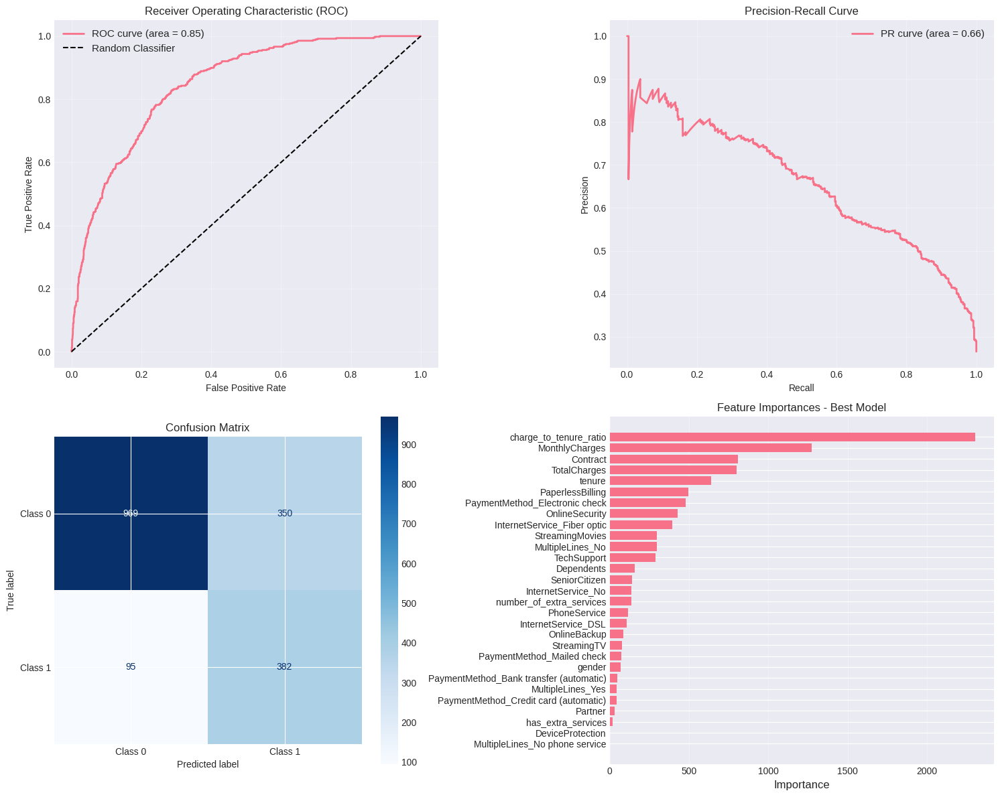

In [ ]:
acc_score, prec, rec, f1 = print_all_metrics(y_eval, y_predict, y_proba=y_proba)

fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fpr, tpr, _ = roc_curve(y_eval, y_proba)
roc_auc = auc(fpr, tpr)

#AUC

axes[0, 0].plot(fpr, tpr, lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
axes[0, 0].plot([0, 1], [0, 1], 'k--', label='Random Classifier')
axes[0, 0].set_xlabel('False Positive Rate')
axes[0, 0].set_ylabel('True Positive Rate')
axes[0, 0].set_title('Receiver Operating Characteristic (ROC)')
axes[0, 0].legend(loc="lower right")
axes[0, 0].legend(fontsize=11)
axes[0, 0].grid(True, alpha=0.3)

#PR
precision, recall, _ = precision_recall_curve(y_eval, y_proba)
pr_auc = auc(recall, precision)

axes[0, 1].plot(recall, precision, lw=2, label=f'PR curve (area = {pr_auc:.2f})')
axes[0, 1].set_xlabel('Recall')
axes[0, 1].set_ylabel('Precision')
axes[0, 1].set_title('Precision-Recall Curve')
axes[0,1].legend(loc="lower left")
axes[0, 1].legend(fontsize=11)
axes[0, 1].grid(True, alpha=0.3)


cm = confusion_matrix(y_eval, y_predict)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Class 0", "Class 1"])
disp.plot(cmap=plt.cm.Blues, ax=axes[1, 0])
axes[1, 0].set_title('Confusion Matrix')

importances = pd.DataFrame({
        'feature': feature_names,
        'importance': best_model.feature_importances_
    }).sort_values('importance', ascending=False)

axes[1, 1].barh(range(len(importances)), importances['importance'])
axes[1, 1].set_yticks(range(len(importances)))
axes[1, 1].set_yticklabels(importances['feature'])
axes[1, 1].invert_yaxis()
axes[1, 1].set_xlabel('Importance', fontsize=12)
axes[1, 1].set_title('Feature Importances - Best Model')
axes[1, 1].grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.show()

## Permutation importance

                                    feature  importance       std
12                                 Contract    0.127084  0.009114
18                   charge_to_tenure_ratio    0.058433  0.011536
24              InternetService_Fiber optic    0.027856  0.006852
21           PaymentMethod_Electronic check    0.010766  0.002977
14                           MonthlyCharges    0.004612  0.003073
23                      InternetService_DSL    0.003514  0.001617
3                                Dependents    0.003429  0.002448
5                              PhoneService    0.003361  0.001424
6                            OnlineSecurity    0.002576  0.002749
13                         PaperlessBilling    0.002423  0.004352
15                             TotalCharges    0.001793  0.002936
26                         MultipleLines_No    0.000821  0.001678
25                       InternetService_No    0.000495  0.001531
16                       has_extra_services    0.000131  0.000599
7         

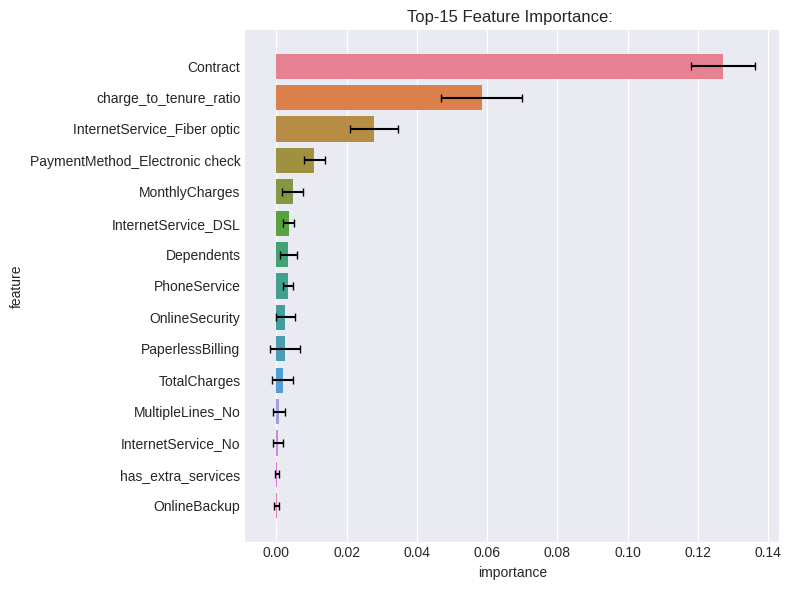

In [ ]:
result = permutation_importance(
    best_model,
    X_eval,
    y_eval,
    scoring='f1',
    n_repeats=10,
    random_state=42,
    n_jobs=-1
)

perm_importances = pd.DataFrame({
    'feature': X_eval.columns.tolist(),
    'importance': result.importances_mean,
    'std': result.importances_std
}).sort_values('importance', ascending=False)

print(perm_importances)

plt.figure(figsize=(8, 6))
features = perm_importances.head(15)
ax = sns.barplot(features, x = 'importance', y = 'feature', hue='feature', legend=False)
ax.errorbar(features['importance'], range(len(features)), xerr=features['std'], fmt='none', c='black', capsize=3)
plt.title(f'Top-15 Feature Importance: ')
plt.tight_layout()
plt.show()

## Shap values


In [ ]:
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_eval)

/usr/local/lib/python3.12/dist-packages/shap/explainers/_tree.py:620: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn(


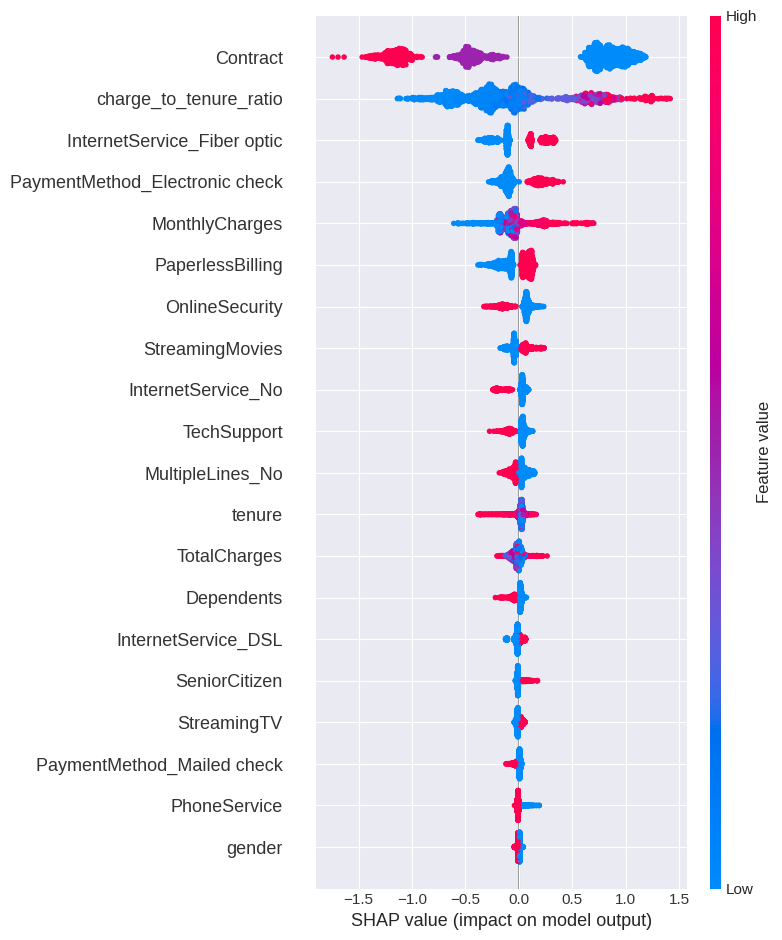

In [ ]:
shap.summary_plot(shap_values, X_eval)

In [ ]:
high = np.argmax(y_proba)
low = np.argmin(y_proba)
midle = np.argmax(np.abs(y_proba - 0.5))
selected_idx = [high, midle, low]
labels = ['Высокий риск', 'Пограничный случай', 'Низкий риск']


=== Высокий риск (клиент #420) ===
Предсказанная вероятность оттока: 0.931
Реальный класс: Ушёл


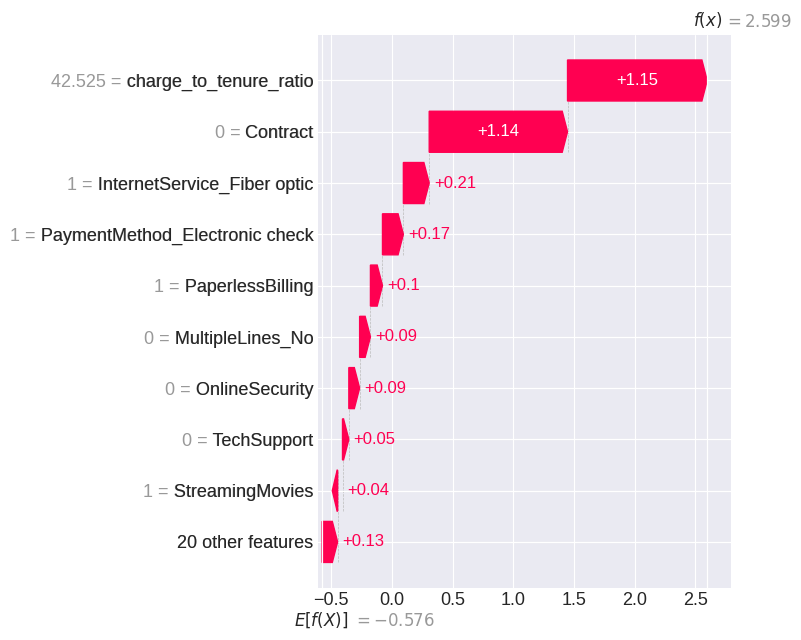


=== Пограничный случай (клиент #333) ===
Предсказанная вероятность оттока: 0.042
Реальный класс: Остался


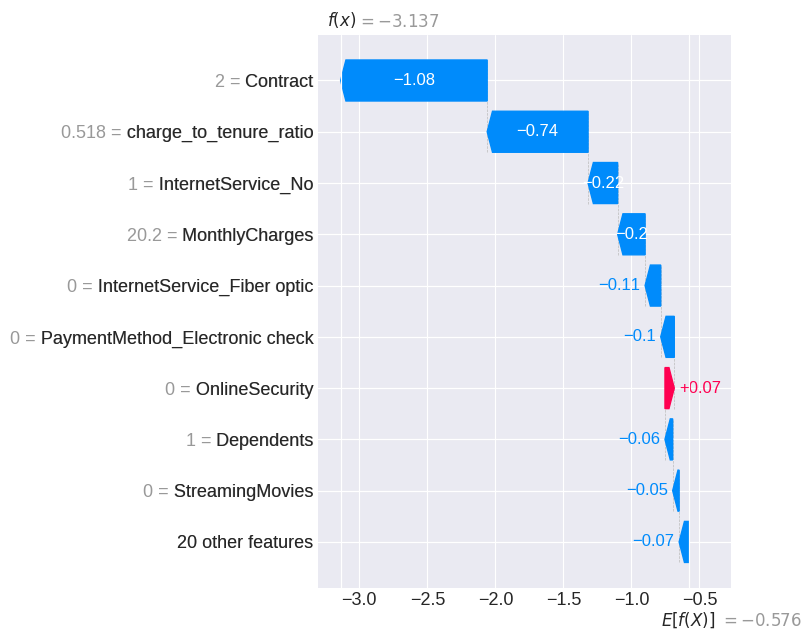


=== Низкий риск (клиент #333) ===
Предсказанная вероятность оттока: 0.042
Реальный класс: Остался


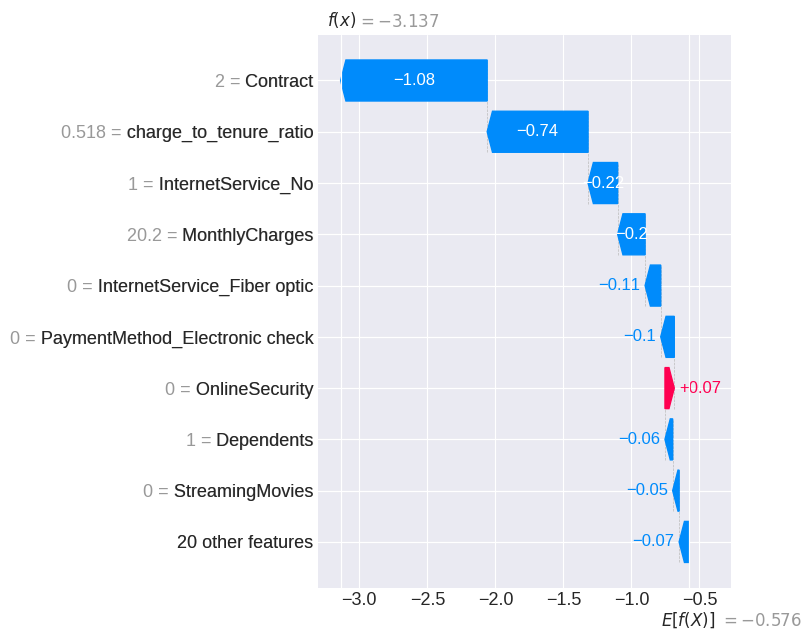

In [ ]:
for idx, label in zip(selected_idx, labels):
    explanation = shap.Explanation(
        values=shap_values[idx],
        base_values=explainer.expected_value,
        data=X_eval.iloc[idx].values,
        feature_names=feature_names
    )
    print(f"\n=== {label} (клиент #{idx}) ===")
    print(f"Предсказанная вероятность оттока: {y_proba[idx]:.3f}")
    print(f"Реальный класс: {'Ушёл' if y_eval.iloc[idx] == 1 else 'Остался'}")
    shap.plots.waterfall(explanation, max_display=10, show=False)
    plt.tight_layout()
    plt.show()

## Threshold

In [ ]:
thresholds = np.arange(0.1, 0.9, 0.05)
results_t = []

for threshold in thresholds:
    y_pred_t = (y_proba >= threshold).astype(int)
    p = precision_score(y_eval, y_pred_t)
    r = recall_score(y_eval, y_pred_t)
    f1 = f1_score(y_eval, y_pred_t)
    results_t.append((threshold, p, r, f1))

results_df = pd.DataFrame(results_t, columns=["threshold", "precision", "recall", "f1"])
results_df

,threshold,precision,recall,f1
0,0.10,0.336902,0.989518,0.502662
1,0.15,0.364420,0.974843,0.530519
2,0.20,0.382107,0.958071,0.546324
3,0.25,0.402504,0.943396,0.564263
4,0.30,0.427043,0.920335,0.583389
5,0.35,0.458468,0.890985,0.605413
6,0.40,0.478923,0.857442,0.614576
7,0.45,0.505732,0.832285,0.629160
8,0.50,0.521858,0.800839,0.631927
9,0.55,0.545455,0.767296,0.637631


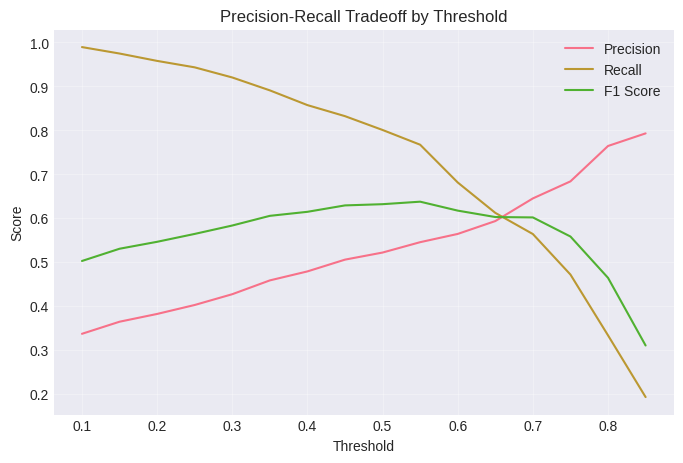

In [ ]:
plt.figure(figsize=(8,5))
plt.plot(results_df["threshold"], results_df["precision"], label="Precision")
plt.plot(results_df["threshold"], results_df["recall"], label="Recall")
plt.plot(results_df["threshold"], results_df["f1"], label="F1 Score")
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.legend()
plt.title("Precision-Recall Tradeoff by Threshold")
plt.grid(alpha=0.3)
plt.show()

## Final Evaluation on Test Set

In [ ]:
X_full_train = pd.concat([X_train, X_eval], ignore_index=True)
y_full_train = np.concatenate([y_train, y_eval])

best_model = LGBMClassifier(random_state=42, verbosity=0, **raw_params).fit(X_full_train, y_full_train)
y_predict = best_model.predict(X_test)
y_proba = best_model.predict_proba(X_test)[:,1]

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines


Оценка качества модели:
----------------------------------------
Accuracy: 0.7634
F1: 0.6479
Precision: 0.5349
Recall: 0.8214
----------------------------------------
ROC_AUC: 0.8426
----------------------------------------
              precision    recall  f1-score   support

  Остался(0)       0.92      0.74      0.82       233
     Ушел(1)       0.53      0.82      0.65        84

    accuracy                           0.76       317
   macro avg       0.73      0.78      0.73       317
weighted avg       0.82      0.76      0.78       317



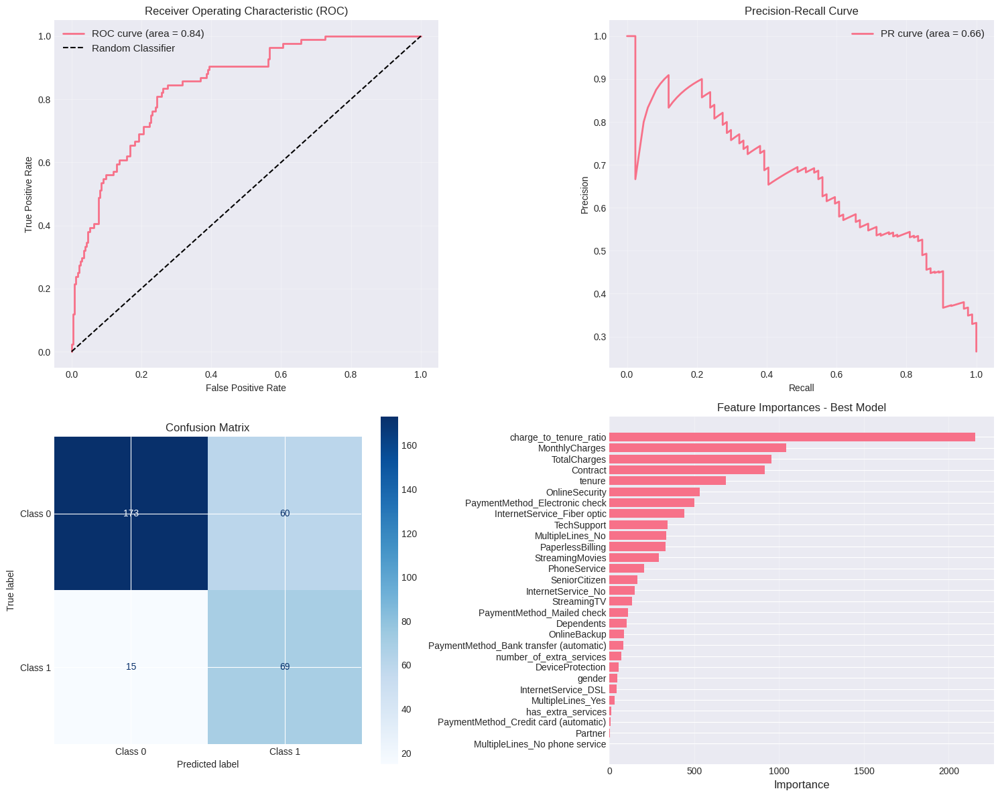

In [ ]:
acc_score, prec, rec, f1 = print_all_metrics(y_test, y_predict, y_proba=y_proba)

fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fpr, tpr, _ = roc_curve(y_test, y_proba)
roc_auc = auc(fpr, tpr)

#AUC

axes[0, 0].plot(fpr, tpr, lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
axes[0, 0].plot([0, 1], [0, 1], 'k--', label='Random Classifier')
axes[0, 0].set_xlabel('False Positive Rate')
axes[0, 0].set_ylabel('True Positive Rate')
axes[0, 0].set_title('Receiver Operating Characteristic (ROC)')
axes[0, 0].legend(loc="lower right")
axes[0, 0].legend(fontsize=11)
axes[0, 0].grid(True, alpha=0.3)

#PR
precision, recall, _ = precision_recall_curve(y_test, y_proba)
pr_auc = auc(recall, precision)

axes[0, 1].plot(recall, precision, lw=2, label=f'PR curve (area = {pr_auc:.2f})')
axes[0, 1].set_xlabel('Recall')
axes[0, 1].set_ylabel('Precision')
axes[0, 1].set_title('Precision-Recall Curve')
axes[0,1].legend(loc="lower left")
axes[0, 1].legend(fontsize=11)
axes[0, 1].grid(True, alpha=0.3)


cm = confusion_matrix(y_test, y_predict)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Class 0", "Class 1"])
disp.plot(cmap=plt.cm.Blues, ax=axes[1, 0])
axes[1, 0].set_title('Confusion Matrix')

importances = pd.DataFrame({
        'feature': feature_names,
        'importance': best_model.feature_importances_
    }).sort_values('importance', ascending=False)

axes[1, 1].barh(range(len(importances)), importances['importance'])
axes[1, 1].set_yticks(range(len(importances)))
axes[1, 1].set_yticklabels(importances['feature'])
axes[1, 1].invert_yaxis()
axes[1, 1].set_xlabel('Importance', fontsize=12)
axes[1, 1].set_title('Feature Importances - Best Model')
axes[1, 1].grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.show()

In [ ]:
for t, label in [(0.30, 'Recall-приоритет'), (0.50, 'Баланс'), (0.70, 'Precision-приоритет')]:
    y_pred_test = (y_proba >= t).astype(int)
    print(f"\n=== TEST | {label} (threshold={t}) ===")
    print_all_metrics(y_test, y_pred_test, y_proba)


=== TEST | Recall-приоритет (threshold=0.3) ===
Оценка качества модели:
----------------------------------------
Accuracy: 0.6404
F1: 0.5714
Precision: 0.4176
Recall: 0.9048
----------------------------------------
ROC_AUC: 0.8426
----------------------------------------
              precision    recall  f1-score   support

  Остался(0)       0.94      0.55      0.69       233
     Ушел(1)       0.42      0.90      0.57        84

    accuracy                           0.64       317
   macro avg       0.68      0.72      0.63       317
weighted avg       0.80      0.64      0.66       317


=== TEST | Баланс (threshold=0.5) ===
Оценка качества модели:
----------------------------------------
Accuracy: 0.7634
F1: 0.6479
Precision: 0.5349
Recall: 0.8214
----------------------------------------
ROC_AUC: 0.8426
----------------------------------------
              precision    recall  f1-score   support

  Остался(0)       0.92      0.74      0.82       233
     Ушел(1)       0.53     

In [ ]:
import pickle

with open('best_model.pkl', 'wb') as f:
    pickle.dump(best_model, f)